# Project: Wrangling and Analyze Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import requests as req
import json 
%matplotlib inline
#importing all the possible extensions that will be useful for the project

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.
1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [2]:
TA = pd.read_csv('twitter-archive-enhanced.csv')

2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [3]:
#downloading the twitter images using the requests libary
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = req.get(url)
response

<Response [200]>

In [4]:
# Saving the dwonloaded image files
open('image-predictions.tsv',mode = 'wb').write(response.content)

335079

In [5]:
#converting the tsv file into an accesible and readable file in notebooks
images = pd.read_csv('image-predictions.tsv', sep ='\t')

In [6]:
#viewing(testing the code) the file
images .head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

In [7]:
import tweepy
from tweepy import OAuthHandler
import json
from timeit import default_timer as timer
#importing the neccessary packages


In [8]:
# Query Twitter API for each tweet in the Twitter archive and save JSON in a text file
# These are hidden to comply with Twitter's API terms and conditions
consumer_key = 'HIDDEN'
consumer_secret = 'HIDDEN'
access_token = 'HIDDEN'
access_secret = 'HIDDEN'

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)
#OAuthHander is used for authentication of password without exposing it .

api = tweepy.API(auth, wait_on_rate_limit=True)

# NOTE TO STUDENT WITH MOBILE VERIFICATION ISSUES:
# df_1 is a DataFrame with the twitter_archive_enhanced.csv file. You may have to
# change line 17 to match the name of your DataFrame with twitter_archive_enhanced.csv
# NOTE TO REVIEWER: this student had mobile verification issues so the following
# Twitter API code was sent to this student from a Udacity instructor
# Tweet IDs for which to gather additional data via Twitter's API
df_1 = pd.read_csv('twitter-archive-enhanced.csv')
tweet_ids = df_1.tweet_id.values
len(tweet_ids)

# Query Twitter's API for JSON data for each tweet ID in the Twitter archive
count = 0
fails_dict = {}
start = timer()
# Save each tweet's returned JSON as a new line in a .txt file
with open('tweet_json.txt', 'w') as outfile:
    #The code above saves each tweet returned from the loop into a combined file called 'tweet_json.txt', which can be seen in the file directory.
    # This loop will likely take 20-30 minutes to run because of Twitter's rate limit
    for tweet_id in tweet_ids:
        count += 1
        print(str(count) + ": " + str(tweet_id))
        try:
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            print("Success")
            json.dump(tweet._json, outfile)
            outfile.write('\n')
        except tweepy.errors.TweepyException as e:
            print("Fail")
            fails_dict[tweet_id] = e
            pass
end = timer()
print(end - start)
print(fails_dict)

1: 892420643555336193
Fail
2: 892177421306343426
Fail
3: 891815181378084864
Fail
4: 891689557279858688
Fail
5: 891327558926688256
Fail
6: 891087950875897856
Fail
7: 890971913173991426
Fail
8: 890729181411237888
Fail
9: 890609185150312448
Fail
10: 890240255349198849
Fail
11: 890006608113172480
Fail
12: 889880896479866881
Fail
13: 889665388333682689
Fail
14: 889638837579907072
Fail
15: 889531135344209921
Fail
16: 889278841981685760
Fail
17: 888917238123831296
Fail
18: 888804989199671297
Fail
19: 888554962724278272
Fail
20: 888202515573088257
Fail
21: 888078434458587136
Fail
22: 887705289381826560
Fail
23: 887517139158093824
Fail
24: 887473957103951883
Fail
25: 887343217045368832
Fail
26: 887101392804085760
Fail
27: 886983233522544640
Fail
28: 886736880519319552
Fail
29: 886680336477933568
Fail
30: 886366144734445568
Fail
31: 886267009285017600
Fail
32: 886258384151887873
Fail
33: 886054160059072513
Fail
34: 885984800019947520
Fail
35: 885528943205470208
Fail
36: 885518971528720385
Fail
3

Fail
288: 838561493054533637
Fail
289: 838476387338051585
Fail
290: 838201503651401729
Fail
291: 838150277551247360
Fail
292: 838085839343206401
Fail
293: 838083903487373313
Fail
294: 837820167694528512
Fail
295: 837482249356513284
Fail
296: 837471256429613056
Fail
297: 837366284874571778
Fail
298: 837110210464448512
Fail
299: 837012587749474308
Fail
300: 836989968035819520
Fail
301: 836753516572119041
Fail
302: 836677758902222849
Fail
303: 836648853927522308
Fail
304: 836397794269200385
Fail
305: 836380477523124226
Fail
306: 836260088725786625
Fail
307: 836001077879255040
Fail
308: 835685285446955009
Fail
309: 835574547218894849
Fail
310: 835536468978302976
Fail
311: 835309094223372289
Fail
312: 835297930240217089
Fail
313: 835264098648616962
Fail
314: 835246439529840640
Fail
315: 835172783151792128
Fail
316: 835152434251116546
Fail
317: 834931633769889797
Fail
318: 834786237630337024
Fail
319: 834574053763584002
Fail
320: 834477809192075265
Fail
321: 834458053273591808
Fail
322: 8342

Fail
571: 801854953262350336
Fail
572: 801538201127157760
Fail
573: 801285448605831168
Fail
574: 801167903437357056
Fail
575: 801127390143516673
Fail
576: 801115127852503040
Fail
577: 800859414831898624
Fail
578: 800855607700029440
Fail
579: 800751577355128832
Fail
580: 800513324630806528
Fail
581: 800459316964663297
Fail
582: 800443802682937345
Fail
583: 800388270626521089
Fail
584: 800188575492947969
Fail
585: 800141422401830912
Fail
586: 800018252395122689
Fail
587: 799774291445383169
Fail
588: 799757965289017345
Fail
589: 799422933579902976
Fail
590: 799308762079035393
Fail
591: 799297110730567681
Fail
592: 799063482566066176
Fail
593: 798933969379225600
Fail
594: 798925684722855936
Fail
595: 798705661114773508
Fail
596: 798701998996647937
Fail
597: 798697898615730177
Fail
598: 798694562394996736
Fail
599: 798686750113755136
Fail
600: 798682547630837760
Fail
601: 798673117451325440
Fail
602: 798665375516884993
Fail
603: 798644042770751489
Fail
604: 798628517273620480
Fail
605: 7985

Fail
854: 765371061932261376
Fail
855: 765222098633691136
Fail
856: 764857477905154048
Fail
857: 764259802650378240
Fail
858: 763956972077010945
Fail
859: 763837565564780549
Fail
860: 763183847194451968
Fail
861: 763167063695355904
Fail
862: 763103485927849985
Fail
863: 762699858130116608
Fail
864: 762471784394268675
Fail
865: 762464539388485633
Fail
866: 762316489655476224
Fail
867: 762035686371364864
Fail
868: 761976711479193600
Fail
869: 761750502866649088
Fail
870: 761745352076779520
Fail
871: 761672994376806400
Fail
872: 761599872357261312
Fail
873: 761371037149827077
Fail
874: 761334018830917632
Fail
875: 761292947749015552
Fail
876: 761227390836215808
Fail
877: 761004547850530816
Fail
878: 760893934457552897
Fail
879: 760656994973933572
Fail
880: 760641137271070720
Fail
881: 760539183865880579
Fail
882: 760521673607086080
Fail
883: 760290219849637889
Fail
884: 760252756032651264
Fail
885: 760190180481531904
Fail
886: 760153949710192640
Fail
887: 759943073749200896
Fail
888: 7599

Fail
1132: 728986383096946689
Fail
1133: 728760639972315136
Fail
1134: 728751179681943552
Fail
1135: 728653952833728512
Fail
1136: 728409960103686147
Fail
1137: 728387165835677696
Fail
1138: 728046963732717569
Fail
1139: 728035342121635841
Fail
1140: 728015554473250816
Fail
1141: 727685679342333952
Fail
1142: 727644517743104000
Fail
1143: 727524757080539137
Fail
1144: 727314416056803329
Fail
1145: 727286334147182592
Fail
1146: 727175381690781696
Fail
1147: 727155742655025152
Fail
1148: 726935089318363137
Fail
1149: 726887082820554753
Fail
1150: 726828223124897792
Fail
1151: 726224900189511680
Fail
1152: 725842289046749185
Fail
1153: 725786712245440512
Fail
1154: 725729321944506368
Fail
1155: 725458796924002305
Fail
1156: 724983749226668032
Fail
1157: 724771698126512129
Fail
1158: 724405726123311104
Fail
1159: 724049859469295616
Fail
1160: 724046343203856385
Fail
1161: 724004602748780546
Fail
1162: 723912936180330496
Fail
1163: 723688335806480385
Fail
1164: 723673163800948736
Fail
1165:

Fail
1406: 699323444782047232
Fail
1407: 699088579889332224
Fail
1408: 699079609774645248
Fail
1409: 699072405256409088
Fail
1410: 699060279947165696
Fail
1411: 699036661657767936
Fail
1412: 698989035503689728
Fail
1413: 698953797952008193
Fail
1414: 698907974262222848
Fail
1415: 698710712454139905
Fail
1416: 698703483621523456
Fail
1417: 698635131305795584
Fail
1418: 698549713696649216
Fail
1419: 698355670425473025
Fail
1420: 698342080612007937
Fail
1421: 698262614669991936
Fail
1422: 698195409219559425
Fail
1423: 698178924120031232
Fail
1424: 697995514407682048
Fail
1425: 697990423684476929
Fail
1426: 697943111201378304
Fail
1427: 697881462549430272
Fail
1428: 697630435728322560
Fail
1429: 697616773278015490
Fail
1430: 697596423848730625
Fail
1431: 697575480820686848
Fail
1432: 697516214579523584
Fail
1433: 697482927769255936
Fail
1434: 697463031882764288
Fail
1435: 697270446429966336
Fail
1436: 697259378236399616
Fail
1437: 697255105972801536
Fail
1438: 697242256848379904
Fail
1439:

Fail
1680: 682032003584274432
Fail
1681: 682003177596559360
Fail
1682: 681981167097122816
Fail
1683: 681891461017812993
Fail
1684: 681694085539872773
Fail
1685: 681679526984871937
Fail
1686: 681654059175129088
Fail
1687: 681610798867845120
Fail
1688: 681579835668455424
Fail
1689: 681523177663676416
Fail
1690: 681340665377193984
Fail
1691: 681339448655802368
Fail
1692: 681320187870711809
Fail
1693: 681302363064414209
Fail
1694: 681297372102656000
Fail
1695: 681281657291280384
Fail
1696: 681261549936340994
Fail
1697: 681242418453299201
Fail
1698: 681231109724700672
Fail
1699: 681193455364796417
Fail
1700: 680970795137544192
Fail
1701: 680959110691590145
Fail
1702: 680940246314430465
Fail
1703: 680934982542561280
Fail
1704: 680913438424612864
Fail
1705: 680889648562991104
Fail
1706: 680836378243002368
Fail
1707: 680805554198020098
Fail
1708: 680801747103793152
Fail
1709: 680798457301471234
Fail
1710: 680609293079592961
Fail
1711: 680583894916304897
Fail
1712: 680497766108381184
Fail
1713:

Fail
1954: 673662677122719744
Fail
1955: 673656262056419329
Fail
1956: 673636718965334016
Fail
1957: 673612854080196609
Fail
1958: 673583129559498752
Fail
1959: 673580926094458881
Fail
1960: 673576835670777856
Fail
1961: 673363615379013632
Fail
1962: 673359818736984064
Fail
1963: 673355879178194945
Fail
1964: 673352124999274496
Fail
1965: 673350198937153538
Fail
1966: 673345638550134785
Fail
1967: 673343217010679808
Fail
1968: 673342308415348736
Fail
1969: 673320132811366400
Fail
1970: 673317986296586240
Fail
1971: 673295268553605120
Fail
1972: 673270968295534593
Fail
1973: 673240798075449344
Fail
1974: 673213039743795200
Fail
1975: 673148804208660480
Fail
1976: 672997845381865473
Fail
1977: 672995267319328768
Fail
1978: 672988786805112832
Fail
1979: 672984142909456390
Fail
1980: 672980819271634944
Fail
1981: 672975131468300288
Fail
1982: 672970152493887488
Fail
1983: 672968025906282496
Fail
1984: 672964561327235073
Fail
1985: 672902681409806336
Fail
1986: 672898206762672129
Fail
1987:

Fail
2228: 668268907921326080
Fail
2229: 668256321989451776
Fail
2230: 668248472370458624
Fail
2231: 668237644992782336
Fail
2232: 668226093875376128
Fail
2233: 668221241640230912
Fail
2234: 668204964695683073
Fail
2235: 668190681446379520
Fail
2236: 668171859951755264
Fail
2237: 668154635664932864
Fail
2238: 668142349051129856
Fail
2239: 668113020489474048
Fail
2240: 667937095915278337
Fail
2241: 667924896115245057
Fail
2242: 667915453470232577
Fail
2243: 667911425562669056
Fail
2244: 667902449697558528
Fail
2245: 667886921285246976
Fail
2246: 667885044254572545
Fail
2247: 667878741721415682
Fail
2248: 667873844930215936
Fail
2249: 667866724293877760
Fail
2250: 667861340749471744
Fail
2251: 667832474953625600
Fail
2252: 667806454573760512
Fail
2253: 667801013445750784
Fail
2254: 667793409583771648
Fail
2255: 667782464991965184
Fail
2256: 667773195014021121
Fail
2257: 667766675769573376
Fail
2258: 667728196545200128
Fail
2259: 667724302356258817
Fail
2260: 667550904950915073
Fail
2261:

# Downloading the json file via url
The file will be downloaded via a url since twitter refused me a developer account for some unknown reasons.

In [9]:
url = 'https://video.udacity-data.com/topher/2018/November/5be5fb7d_tweet-json/tweet-json.txt'
response = req.get(url)
response

<Response [200]>

In [10]:
#saving the file
open('tweet-json.txt', mode ='wb').write(response.content)


10609234

In [11]:
#reading the downloaded file
twitter_df =[]
with open('tweet-json.txt', 'r') as file:
    lines = file.readlines()
    

In [12]:
#reading the file line by line
twitter_df =[]
for line in lines:
        parsed_json = json.loads(line)
        twitter_df.append({'tweet_id': parsed_json['id'],
                        'retweet_count': parsed_json['retweet_count'],
                        'favorite_count': parsed_json['favorite_count']})
        
tweet_json = pd.DataFrame(twitter_df, columns = ['tweet_id', 'retweet_count', 'favorite_count'])
    

In [13]:
#viewing the data
tweet_json.head()

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048


## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



# ASSESSING THE VARIOUS DATAFRAMES VISUALLY
#  FOR TA dataframe

In [14]:
TA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [15]:
TA.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


In [16]:
TA.tail()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None
2355,666020888022790149,NaN,NaN,2015-11-15 22:32:08 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a Japanese Irish Setter. Lost eye...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666020888...,8,10,None,None,None,None,None


In [17]:
TA.duplicated().sum()

0

In [18]:
TA.tweet_id.duplicated().sum()

0

# # Value counts function will be used on individual columns to get an idea of how many occurences of unique variables we have for each variable 

In [19]:
TA.timestamp.value_counts()

2017-08-01 16:23:56 +0000    1
2016-01-13 02:43:46 +0000    1
2016-01-15 02:41:12 +0000    1
2016-01-15 02:08:05 +0000    1
2016-01-15 01:25:33 +0000    1
                            ..
2016-09-11 21:34:30 +0000    1
2016-09-10 23:54:11 +0000    1
2016-09-10 16:03:16 +0000    1
2016-09-09 18:31:54 +0000    1
2015-11-15 22:32:08 +0000    1
Name: timestamp, Length: 2356, dtype: int64

In [20]:

#double checking to make sure the dataframe does nt contain any data 2018
print('2018' in TA['timestamp'].unique())

False


In [21]:
TA.rating_denominator.value_counts()

10     2333
11        3
50        3
20        2
80        2
70        1
7         1
15        1
150       1
170       1
0         1
90        1
40        1
130       1
110       1
16        1
120       1
2         1
Name: rating_denominator, dtype: int64

In [22]:
TA.rating_numerator.value_counts()

12      558
11      464
10      461
13      351
9       158
8       102
7        55
14       54
5        37
6        32
3        19
4        17
2         9
1         9
75        2
15        2
420       2
0         2
80        1
144       1
17        1
26        1
20        1
121       1
143       1
44        1
60        1
45        1
50        1
99        1
204       1
1776      1
165       1
666       1
27        1
182       1
24        1
960       1
84        1
88        1
Name: rating_numerator, dtype: int64

In [23]:
TA.source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

In [24]:
TA.doggo.value_counts()

None     2259
doggo      97
Name: doggo, dtype: int64

In [25]:
TA.floofer.value_counts()

None       2346
floofer      10
Name: floofer, dtype: int64

In [26]:
TA.pupper.value_counts()

None      2099
pupper     257
Name: pupper, dtype: int64

In [27]:
TA.puppo.value_counts()

None     2326
puppo      30
Name: puppo, dtype: int64

In [28]:
TA.retweeted_status_id.value_counts().sum()

181

In [29]:
TA.retweeted_status_user_id.value_counts().sum()

181

In [30]:
TA.rating_denominator.isna().sum()

0

OBSERVATIONS
1. There are ridiculously  very high values such as 204,1776,960,666,143,182,144,88,84,165,60,50,44,26,24,80,75,420, in the numerator column and 2333 for the denominator column which makes no sense
2. The timestamp column is in string format should be in date time and +0000 will have to be removed
3. columns such as text, retweets and replies ,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp do not appear to be useful to the analysis since the analysis should involve only original tweets ,hence  should be dropped.
4. The floofer, pupper,puppo,doggo columns should all be in a column since they are nick-names of dogs.
5. in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp have a staggering amount of nulls.
6. Dog names in the name column have many variables that are not dog names

#  ASSESMENT FOR IMAGES DATAFRAME

In [31]:
images.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [32]:
images.tail()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True
2074,892420643555336193,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False


In [33]:
images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [34]:
images.duplicated().sum()

0

In [35]:
images.jpg_url.duplicated().sum()

66

In [36]:
images.isnull().sum()

tweet_id    0
jpg_url     0
img_num     0
p1          0
p1_conf     0
p1_dog      0
p2          0
p2_conf     0
p2_dog      0
p3          0
p3_conf     0
p3_dog      0
dtype: int64

In [37]:
images.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [38]:
pd.get_option('display.max_rows', None)
#to display more rows

60

In [39]:
images.p1

0       Welsh_springer_spaniel
1                      redbone
2              German_shepherd
3          Rhodesian_ridgeback
4           miniature_pinscher
                 ...          
2070                    basset
2071               paper_towel
2072                 Chihuahua
2073                 Chihuahua
2074                    orange
Name: p1, Length: 2075, dtype: object

 we will be using value_counts again to single out unique variables

In [40]:
images.img_num.value_counts()

1    1780
2     198
3      66
4      31
Name: img_num, dtype: int64

#As seen in the cell above, we have 31 occurences for the variable '4' in the dataframe, 
those 31 occurences means there are 31 rows of data that do not fall into the most confident category for dog breed analysis , hence they will not be useful to the analysis.

In [41]:
images.p1_dog.value_counts()

True     1532
False     543
Name: p1_dog, dtype: int64

In [42]:
images.p2_dog.value_counts()

True     1553
False     522
Name: p2_dog, dtype: int64

In [43]:
images.p3_dog.value_counts()

True     1499
False     576
Name: p3_dog, dtype: int64

The 3 cells above shows that there are 543(p1_dog),522(p2_dog) and 576(p3_dog) that the neural network does not identify as dogs and hence should not be used for the analysis.

In [44]:
images.p1.value_counts()

golden_retriever      150
Labrador_retriever    100
Pembroke               89
Chihuahua              83
pug                    57
                     ... 
pillow                  1
carousel                1
bald_eagle              1
lorikeet                1
orange                  1
Name: p1, Length: 378, dtype: int64

In [45]:
images.p2.value_counts()

Labrador_retriever    104
golden_retriever       92
Cardigan               73
Chihuahua              44
Pomeranian             42
                     ... 
medicine_chest          1
quail                   1
horse_cart              1
waffle_iron             1
bagel                   1
Name: p2, Length: 405, dtype: int64

In [46]:
images.p3.value_counts()

Labrador_retriever    79
Chihuahua             58
golden_retriever      48
Eskimo_dog            38
kelpie                35
                      ..
ox                     1
assault_rifle          1
axolotl                1
pot                    1
banana                 1
Name: p3, Length: 408, dtype: int64

OBSERVATIONS
1. Some entries are not actually dog breeds, we are having entries such as banana, paper towel,bagel, orange, spatula, etc.
2. Presence of duplicate image urls
3. There are no null values, which is a good thing.
4. The capitalization in the p- columns are inconsistent.
5. There are 31 occurences in the datarame that do not fall into the most confident prediction for dog breed analysis


#  ASSESSMENT FOR TWEET_JSON DATAFRAME

In [47]:
tweet_json

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
...,...,...,...
2349,666049248165822465,41,111
2350,666044226329800704,147,311
2351,666033412701032449,47,128
2352,666029285002620928,48,132


In [48]:
tweet_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   tweet_id        2354 non-null   int64
 1   retweet_count   2354 non-null   int64
 2   favorite_count  2354 non-null   int64
dtypes: int64(3)
memory usage: 55.3 KB


In [49]:
tweet_json.tweet_id.value_counts().sum()

2354

In [50]:
tweet_json.retweet_count.value_counts()

1972    5
3652    5
83      5
1207    4
336     4
       ..
3357    1
3018    1
2181    1
848     1
147     1
Name: retweet_count, Length: 1724, dtype: int64

In [51]:
tweet_json.isna().sum()

tweet_id          0
retweet_count     0
favorite_count    0
dtype: int64

OBSERVATION
1.The tweet_json dataframe have a similar column named tweet_id and hence should be joined to the Twitter_archive(TA) dataframe

# SUMMARY OF OBSERVATIONS :

OBSERVATIONS FOR TA(TWITTER ARCHIVE) DATAFRAME
1. There are ridiculously  very high values such as 204,1776,960,666,143,182,144,88,84,165,60,50,44,26,24,80,75,420, in the numerator column and 2333 for the denominator column which makes no sense
2. The timestamp column is in string format should be in date time and +0000 will have to be removed
3. Dropping irrelevant Columns(in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp.), thcolumns also happen to have a staggering amount of null values and hence should be deleted because they are strings and the null values cant be made up for. 
4. The floofer, pupper,puppo,doggo columns should all be in a column since they are dog-stages of dogs.
5. Name column is full of variables that are not dog names


OBSERVATIONS FOR IMAGES(TWITTER IMAGES)DATAFRAME
1. Some entries are not actually dog names, we are having entries such as banana, paper towel,bagel, orange, spatula, etc.
2. Presence of duplicate image urls
3. There are no null values, which is a good thing.
4. The capitalization in the p- columns are inconsistent.
5. There are 31 occurences in the datarame that do not fall into the most confident prediction for dog breed analysis
6. There are 543(p1_dog),522(p2_dog) and 576(p3_dog) false values that the neural network does not identify as dogs and hence should not be used for the analysis.

OBSERVATION FOR tweet_json dataframe
1.The tweet_json dataframe have a similar column named tweet_id and hence should be joined to the Twitter_archive(TA) dataframe

# Quality issues

## twitter_archive(TA) dataframe
1. There are ridiculously  very high values such as 204,1776,960,666,143,182,144,88,84,165,60,50,44,26,24,80,75,420, in the numerator column and 2333 for the denominator column which makes no sense
2. The timestamp column is in string format should be in date time and +0000 will have to be removed
3. columns such as text, source,retweets and replies ,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp do not appear to be useful to the analysis since the analysis should involve only original tweets ,hence  should be dropped.
4. in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp have a staggering amount of nulls.
5. Name column is full of variables that are not dog names

## images dataframe
1. Some entries are not actually dog breeds, we are having entries such as banana, paper towel,bagel, orange, spatula, etc.
2. Presence of duplicate image urls
3. There are 31 occurences in the datarame that do not fall into the most confident prediction for dog breed analysis.
4. Grouping the p1, p2, p3 columns into one since they are all dog breeds, it makes more sense to have them in a column .
5. The p1_conf, p2_conf and p3_conf levels should all be in a column.
6. The capitalization in the p- columns are inconsistent.


# Tidiness issues

## twitter_archive(TA) dataframe
1. The floofer, pupper,puppo,doggo columns should all be in a column since they are nick-names of dogs.

# images dataframe  
2. The images,twitter archive and tweet_json dataframes should all be combined into a dataframe.


## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [52]:
# Make copies of original pieces of data
clean_TA = TA.copy()
clean_images = images.copy()
clean_tweet_jason = tweet_json.copy()
clean_TA

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


# QUALITY ISSUES

## TWITTER ARCHIVE DF

### Issue #1: DROPPING IRRELEVANT COLUMNS TO THE ANALYSIS
The columns that are irrelevant involves all related to retweets , since we are meant to keep only originals, they include;
in_reply_to_status_id,
in_reply_to_user_id,
retweeted_status_id,
retweeted_status_timestamp,
retweeted_status_user_id,source and expanded_urls.
#### And deletion of rows with non null values for either retweeted status id or retweeted user status id columns

### Deletion of rows with non null values either retweeted status id or retweeted user status id columns

### DEFINE: A subset of the dataframe containing only rows with retweet values will be created using notnull() function and deleted using their indexes via a drop function.

In [53]:
clean_TA.retweeted_status_id.notnull().sum()
#to check how many rows 

181

In [54]:
#displaying all the rows to allow for better visual assessment and understanding
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [55]:
clean_TA.retweeted_status_timestamp.notnull().sum()
#creating a subset of the dataframe
retweets_rows = clean_TA.loc[clean_TA['retweeted_status_id'].notnull()]

In [56]:
list(retweets_rows.index.values)
#list of index to be used for deleting rows with retweet

[19,
 32,
 36,
 68,
 73,
 74,
 78,
 91,
 95,
 97,
 101,
 109,
 118,
 124,
 130,
 132,
 137,
 146,
 155,
 159,
 160,
 165,
 171,
 180,
 182,
 185,
 194,
 195,
 204,
 211,
 212,
 222,
 230,
 231,
 247,
 250,
 260,
 266,
 272,
 273,
 281,
 285,
 286,
 289,
 298,
 302,
 303,
 307,
 309,
 310,
 319,
 327,
 332,
 340,
 341,
 343,
 357,
 359,
 366,
 382,
 386,
 397,
 399,
 406,
 411,
 415,
 420,
 422,
 425,
 431,
 434,
 435,
 438,
 446,
 447,
 450,
 453,
 455,
 462,
 465,
 469,
 475,
 476,
 479,
 485,
 488,
 506,
 522,
 530,
 535,
 538,
 541,
 543,
 546,
 552,
 555,
 558,
 561,
 566,
 568,
 574,
 577,
 581,
 583,
 586,
 589,
 594,
 595,
 596,
 597,
 598,
 599,
 600,
 601,
 602,
 603,
 604,
 605,
 606,
 612,
 615,
 618,
 627,
 629,
 634,
 654,
 655,
 656,
 661,
 664,
 669,
 671,
 677,
 682,
 686,
 692,
 694,
 702,
 720,
 728,
 741,
 742,
 745,
 749,
 753,
 759,
 764,
 767,
 770,
 773,
 778,
 784,
 794,
 800,
 811,
 815,
 818,
 822,
 826,
 829,
 833,
 841,
 847,
 860,
 868,
 872,
 885,
 890,
 8

#### Dropping the rows using the indexes

In [57]:
#clean_TA =clean_TA.drop((retweets_rows.index.values),inplace = True)
clean_TA = clean_TA.drop([19,32,36,68,73,74,78,91,95,97,101,109,118,124,130,132,137,146,155,159,160,165,171,180,182,185,194,195,204,211,
               212,222,230,231,247,250,260,266,272,273,281,285,286,289,298,302,303,307,309,310,319,327,332,340,341,343,357,
               359,366,382,386,397,399,406,411,415,420,422,425,431,434,435,438,446,447,450,453,455,462,465,469,475,476,479,485,
               488,506,522,530,535,538,541,543,546,552,555,558,561,566,568,574,577,581,583,586,589,594,595,596,597,598,599,
               600,601,602,603,604,605,606,612,615,618,627,629,634,654,655,656,661,664,669,671,677,682,686,692,694,702,720,
               728,741,742,745,749,753,759,764,767,770,773,778,784,794,800,811,815,818,822,826,829,833,841,847,860,868,872,885,
               890,895,908,911,926,937,943,949,1012,1023,1043,1242,2259,2260],inplace =False)


In [58]:
clean_TA.retweeted_status_id.notnull().sum()

0

#### Define 2: the drop function will be used to delete the columns at once

#### Code

In [59]:
clean_TA = clean_TA.drop(['in_reply_to_status_id', 
                            'in_reply_to_user_id',
                            'retweeted_status_id',
                            'retweeted_status_user_id',
                            'retweeted_status_timestamp','expanded_urls','source'],axis=1)

#### Test

In [60]:
clean_TA.head()
#it worked!!..yeee!!

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only eve...,13,10,Phineas,None,None,None,None
1,892177421306343426,2017-08-01 00:17:27 +0000,This is Tilly. She's just checking pup on you....,13,10,Tilly,None,None,None,None
2,891815181378084864,2017-07-31 00:18:03 +0000,This is Archie. He is a rare Norwegian Pouncin...,12,10,Archie,None,None,None,None
3,891689557279858688,2017-07-30 15:58:51 +0000,This is Darla. She commenced a snooze mid meal...,13,10,Darla,None,None,None,None
4,891327558926688256,2017-07-29 16:00:24 +0000,This is Franklin. He would like you to stop ca...,12,10,Franklin,None,None,None,None


# ISSUE 2:
## IMAGES DATAFRAME(DF):
### Grouping the p1, p2, p3 columns into one since they are all dog breeds, it makes more sense to have them in a column  and deletion of variables that are not dog breeds after applying the melt

### DEFINE: The melt function will be used to unpivot  the columns and pivot them into one column and a drop function will be used to delete the intermediate column.

### CODE:

In [61]:
clean_images

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


In [62]:
clean_images = pd.melt(clean_images, 
                    id_vars = [ 'tweet_id','jpg_url','img_num','p1_conf','p1_dog','p2_conf','p2_dog','p3_conf','p3_dog'],
                                value_vars = ['p1', 'p2', 'p3'], 
                                var_name = 'p1-p3', 
                                value_name = 'dog_breed')


### TEST :

In [63]:
clean_images.head()

,tweet_id,jpg_url,img_num,p1_conf,p1_dog,p2_conf,p2_dog,p3_conf,p3_dog,p1-p3,dog_breed
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,0.465074,True,0.156665,True,0.061428,True,p1,Welsh_springer_spaniel
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,0.506826,True,0.074192,True,0.072010,True,p1,redbone
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,0.596461,True,0.138584,True,0.116197,True,p1,German_shepherd
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,0.408143,True,0.360687,True,0.222752,True,p1,Rhodesian_ridgeback
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,0.560311,True,0.243682,True,0.154629,True,p1,miniature_pinscher


In [64]:
# DRopping the old column(p1-p3)
clean_images.drop('p1-p3', axis = 1, inplace = True)

In [65]:
#checking for columns to see if the drop worked
clean_images.columns

Index(['tweet_id', 'jpg_url', 'img_num', 'p1_conf', 'p1_dog', 'p2_conf',
       'p2_dog', 'p3_conf', 'p3_dog', 'dog_breed'],
      dtype='object')

In [66]:
#checking for duplicates
clean_images.tweet_id.duplicated().sum()

4150

In [67]:
clean_images.drop_duplicates("tweet_id",inplace = True)

In [68]:
#test
clean_images.tweet_id.duplicated().sum()

0

In [69]:
clean_images.head(20)

,tweet_id,jpg_url,img_num,p1_conf,p1_dog,p2_conf,p2_dog,p3_conf,p3_dog,dog_breed
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,0.465074,True,0.156665,True,0.061428,True,Welsh_springer_spaniel
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,0.506826,True,0.074192,True,0.072010,True,redbone
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,0.596461,True,0.138584,True,0.116197,True,German_shepherd
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,0.408143,True,0.360687,True,0.222752,True,Rhodesian_ridgeback
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,0.560311,True,0.243682,True,0.154629,True,miniature_pinscher
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,0.651137,True,0.263788,True,0.016199,True,Bernese_mountain_dog
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,0.933012,False,0.045885,False,0.017885,False,box_turtle
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,0.692517,True,0.058279,True,0.054449,False,chow
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,0.962465,False,0.014594,False,0.007959,True,shopping_cart
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,0.201493,True,0.192305,True,0.082086,True,miniature_poodle


### TEST :

### DELETION OF NON DOG BREEDS IN THE NEWLY FORMED DOG BREED COLUMN

In [70]:
#assessing the df before deleting the non dog breeds in the dog breed column

clean_images.head()

,tweet_id,jpg_url,img_num,p1_conf,p1_dog,p2_conf,p2_dog,p3_conf,p3_dog,dog_breed
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,0.465074,True,0.156665,True,0.061428,True,Welsh_springer_spaniel
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,0.506826,True,0.074192,True,0.072010,True,redbone
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,0.596461,True,0.138584,True,0.116197,True,German_shepherd
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,0.408143,True,0.360687,True,0.222752,True,Rhodesian_ridgeback
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,0.560311,True,0.243682,True,0.154629,True,miniature_pinscher


In [71]:
#to see each unique value in the dog_breed column
clean_images.dog_breed.value_counts()

golden_retriever                  150
Labrador_retriever                100
Pembroke                           89
Chihuahua                          83
pug                                57
chow                               44
Samoyed                            43
toy_poodle                         39
Pomeranian                         38
cocker_spaniel                     30
malamute                           30
French_bulldog                     26
miniature_pinscher                 23
Chesapeake_Bay_retriever           23
seat_belt                          22
Siberian_husky                     20
German_shepherd                    20
Staffordshire_bullterrier          20
Cardigan                           19
web_site                           19
Eskimo_dog                         18
Maltese_dog                        18
Shetland_sheepdog                  18
teddy                              18
beagle                             18
Lakeland_terrier                   17
Rottweiler  

From the cell above and below, it is seen that we have alot of absurd values that are not dog breeds, we will have to delete all such rows of data , to have a clean data set.
To do this, we have to create a list of all the entries that are not dog breeds by going through eah row.
Upon close observation, dog breed entrieds with a value count of 60 and below are not dog entries

### A loop will be created to use in deleting the non breeds of dogs after creating a list of the non dogs.Its still alot of work though.

In [73]:

#creation of list
non_dogs = ['neck_brace','steam_locomotive','wild_boar','cradle','hen','stone_wall','canoe','waffle_iron','crutch',
            'paper_towel','snorkel','indian_elephant','barrel','wig','mitten','snowmobile','shovel','purse',
           'aschan','window_screen','chimpanzee','comic_book','prison','bookshop','red_wolf','loafer','box_turtle','christmas_stocking','television',
'minivan','sulphur-crested_cockatoo','jaguar','monitor','oxygen_mask','binder','Loggerhead','vacuum','vacuum','indri','consomme','lion',
'lion','tripod','shoji','studio_couch','soap_dispenser','handkerchief','bighorn','squirrel_monkey','bolete','bathtub','refrigerator',
'limousine','limousine','cup','dishwasher','junco','minibus','guinea_pig','persian_cat','swing','tennis_ball','bath_towel','bath_towel',
'white_wolf','ice_bear',"jack-o-'-lantern",'hay','zebra','african_hunting_dog','hyena','toyshop','hog','weasel','arctic_fox','toilet_tissue',
'hog','web_site','bathtub','shopping_cart','muzzle','sea_lion','seat_belt','doormat','beaver','rain_barrel','crib','pretzel','power_drill',
'leafhopper','leafhopper','hair_spray','plow','home_theater','remote_control','paintbrush','tabby','shower_curtain','greenhouse','hatchet',
'spatula','crossword_puzzle','can_opener','bagel','stove','piggy_bank','seashore','wool','tiger_cat','street_sign','hair_slide','rapeseed',
'fountain','radiator','loupe','bouvier_des_flandres','window_shade','panpipe','military_uniform','mashed_potato','mosquito_net','crate',
'hippopotamus','terrapin','golfcart','grocery_store','chest','sorrel','coyote','earthstar','computer_keyboard','snow_leopard','bannister',
'buckeye','hotdog','syringe','carousel','chain_saw','bow','hand_blower','quill','table_lamp','black-footed_ferret','koala','hamster',
'tub','feather_boa','sunglasses','wallaby','brown_bear','sombrero','cougar','ski_mask','gibbon','water_buffalo','fur_coat','shopping_basket',
'quilt','car_mirror','racket','dhole','goose','sandbar','wombat','bubble','ram','swab','book_jacket','jack-o-lantern','giant_panda','pillow',
'american_black_bear','soccer_ball','polecat','space_heater','toilet_seat','dogsled','cowboy_boot','grey_fox','bucket','acorn_squash',
'hare','king_penguin','mongoose','shower_cap','timber_wolf','basketball','paddle','leatherback_turtle','affenpinscher','carton','bathing_cap',
'toyshop','hyena','arabian_camel','barrow','macaque','cowboy_hat','meerkat','sleeping_bag','three-toed_sloth','bonnet','bow_tie','maillot',
'maillot','Sea_lion','conch','Wood_rabbit','menu','ox','corn','skunk','marmot','sock','mouse','tricycle','washbasin','Poncho','Wok','egyptian_cat',
'sliding_door','oscilloscope','mousetrap','nipple','academic_gown','bathtub','hamster','tub','swing','guinea_pig','muzzle','sea_lion','weasel',
'arabian_camel','koala','toilet_tissue','ram','black-footed-ferret','sunglasses','shopping_cart','ox','badger','badger','fountain','jigsaw_puzzle',
'quilt','sandbar','carton','minivan','feather_boa','sandbar','fur_coat','prison','paper_towel','barber_chair','stingray','crash_helmet',
'lifeboat','cockroach','grey_whale','toucan','lynx','candle','tiger','bobsled','accordion','tarantula','sulphur_butterfly','siamang','tray',
'breastplate','orangutan','folding_chair','sandal','promontory','sarong','coral_fungus','European_gallinule','police_van','tree_frog',
'banded_gecko','leaf_beetle','suit','horse_cart','quail','medicine_chest','go-kart','apron','cannon','streetcar','trench_coat','trombone',
'ping-pong_ball','spotted_salamander','knee_pad','toaster','pelican','hamper','cornet','spotlight','drake','lorikeet','coffeepot','grille',
'revolver','pole','barracouta','desk','armadillo','torch','spindle','turnstile','Gila_monster','chain_mail','breakwater','solar_dish',
'barbershop','lesser_panda','great_grey_owl','patridge','dock','projectile','dumbell','rule','pencil_box','sweatshirt','lighter','necklace',
'ipod','dam','confectionery','volcano','saltshaker','gar','washer','leopard','coho','fire_engine','lacewing','flamingo','microphone',
'pitcher','pitcher','bee_eater','starfish','screen','robin','dumbbell','patridge','acorn','jeep','African_chamelon','Band_Aid','French_horn',
'balance_beam','bulletproof_vest','wooden_spoon','wing','cardoon','wolf_spider','stinkhorn','drumstick','plastic_bag','African_crocodile',
'African_grey','agama','alp','American_black_bear','Arabian_camel','Arctic_fox','axolotl','bakery','bald_eagle','balloon','banana','barbell',
'beach_wagon','bearskin','bib','binoculars','birdhouse','bison','boathouse','bookcase','cash_machine','cheeseburger','cheetah','china_cabinet',
'Christmas_stocking','cliff','clog','coffee_mug','coil','clumber','common_iguana','convertible','coral_reef','crane','cuirass','damselfly',
'desktop_computer','dining_table','dough','Egyptian_cat','electric_fan','envelope','espresso','fiddler_crab','four-poster','frilled_lizard',
'gas_pump','geyser','gondola','guenon','hammer','harp','hermit_crab','hummingbird','ibex',"jack-o'-lantern",'jellyfish','jersey','killer_whale',
'lakeside','laptop','lawn_mower','llama','Loafer','long-horned_beetle','Madagascar_cat','mailbox','maze','microwave','motor_scooter','mud_turtle',
'nail','ocarina','orange','ostrich','otter','padlock','park_bench','patio','peacock','pedestal','pool_table','porcupine','pot','prayer_rug',
'radio_telescope','redbone','restaurant','school_bus','scorpion','sea_urchin','shield','Siamese_cat','slug','snail','sundial','tailed_frog',
'teapot','tick','tiger_shark','traffic_light','triceratops','tusker','upright','walking_stick','water_bottle','wood_rabbit','platypus']

#creation of the loops to use in deleting the non dogs
for breed in non_dogs:
    clean_breeds = clean_images[(clean_images['dog_breed'] == breed)].index
    clean_images.drop(clean_breeds, inplace=True)

In [75]:
#testing 
(clean_images['dog_breed'].eq('tick')).any()

False

In [76]:
#testing 
clean_images.dog_breed.value_counts()

golden_retriever                  150
Labrador_retriever                100
Pembroke                           89
Chihuahua                          83
pug                                57
chow                               44
Samoyed                            43
toy_poodle                         39
Pomeranian                         38
malamute                           30
cocker_spaniel                     30
French_bulldog                     26
miniature_pinscher                 23
Chesapeake_Bay_retriever           23
Siberian_husky                     20
German_shepherd                    20
Staffordshire_bullterrier          20
Cardigan                           19
Eskimo_dog                         18
beagle                             18
Shetland_sheepdog                  18
teddy                              18
Maltese_dog                        18
Lakeland_terrier                   17
Rottweiler                         17
Shih-Tzu                           17
kuvasz      

In [77]:
#testing 
#we can use any of the words in quotes from the cell above
(clean_images['dog_breed'].eq('jeep')).any()

False

In [78]:
clean_images

,tweet_id,jpg_url,img_num,p1_conf,p1_dog,p2_conf,p2_dog,p3_conf,p3_dog,dog_breed
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,0.465074,True,0.156665,True,6.142850e-02,True,Welsh_springer_spaniel
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,0.596461,True,0.138584,True,1.161970e-01,True,German_shepherd
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,0.408143,True,0.360687,True,2.227520e-01,True,Rhodesian_ridgeback
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,0.560311,True,0.243682,True,1.546290e-01,True,miniature_pinscher
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,0.651137,True,0.263788,True,1.619920e-02,True,Bernese_mountain_dog
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,0.692517,True,0.058279,True,5.444860e-02,False,chow
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,0.201493,True,0.192305,True,8.208610e-02,True,miniature_poodle
10,666063827256086533,https://pbs.twimg.com/media/CT5Vg_wXIAAXfnj.jpg,1,0.775930,True,0.093718,True,7.242660e-02,True,golden_retriever
11,666071193221509120,https://pbs.twimg.com/media/CT5cN_3WEAAlOoZ.jpg,1,0.503672,True,0.174201,True,1.094540e-01,True,Gordon_setter
12,666073100786774016,https://pbs.twimg.com/media/CT5d9DZXAAALcwe.jpg,1,0.260857,True,0.175382,True,9.747050e-02,True,Walker_hound


The spreadsheet clean up worked, as it can be seen above after using value counts for the dog breed column, there are no more values that are not dog breeds.

## ISSUE 3:

#### Twitter_archive DF :
#### Deletion of Non dog names in the Name column

### Define:
Upon observation the variables in the Name column are  all  lower case , and this can be used to filter them and delete them

In [79]:
#obtaining the frequency of the variables and sorting them 
mask = clean_TA.name.str.contains('^[a-z]', regex = True)
clean_TA[mask].name.value_counts().sort_index()

a               55
actually         2
all              1
an               6
by               1
getting          2
his              1
incredibly       1
infuriating      1
just             3
life             1
light            1
mad              1
my               1
not              2
officially       1
old              1
one              4
quite            3
space            1
such             1
the              8
this             1
unacceptable     1
very             4
Name: name, dtype: int64

In [80]:
not_dogs = ['a','actually','all','an','by','getting','his','incredibly','infuriating','just','life','light','mad','my','not',
            'officially','old','one','quite','space','such','the','this','unacceptable','very']

In [81]:
clean_TA = clean_TA[~clean_TA.isin(not_dogs)]

In [82]:
### TEST:
clean_TA.name

0              Phineas
1                Tilly
2               Archie
3                Darla
4             Franklin
5                 None
6                  Jax
7                 None
8                 Zoey
9               Cassie
10                Koda
11               Bruno
12                None
13                 Ted
14              Stuart
15              Oliver
16                 Jim
17                Zeke
18             Ralphus
20              Gerald
21             Jeffrey
22                 NaN
23              Canela
24                None
25                None
26                Maya
27              Mingus
28               Derek
29              Roscoe
30                None
31             Waffles
33               Jimbo
34              Maisey
35                None
37                None
38                Earl
39                Lola
40               Kevin
41                None
42                None
43                Yogi
44                Noah
45               Bella
46         

In [83]:
clean_TA.name.value_counts()
#VALUE COUNTS TO SHOW ALL THE VARIABLES IN THE NAME COLUMN

None              680
Lucy               11
Charlie            11
Cooper             10
Oliver             10
Tucker              9
Penny               9
Winston             8
Lola                8
Sadie               8
Daisy               7
Toby                7
Stanley             6
Koda                6
Oscar               6
Jax                 6
Bella               6
Bailey              6
Bo                  6
Rusty               5
Chester             5
Scout               5
Buddy               5
Louis               5
Dave                5
Bentley             5
Leo                 5
Milo                5
Clarence            4
Phil                4
Maggie              4
Jack                4
Oakley              4
Larry               4
Chip                4
Brody               4
Sophie              4
Winnie              4
George              4
Boomer              4
Duke                4
Clark               4
Sammy               4
Jerry               4
Finn                4
Reggie    

# Issue 4:
## TA(twitter_archive) DF;

### FIXING ABNORMALLY HIGH VALUES FOR THE RATING  DENOMINATOR COLUMNS


### Define:
Upon observation of the text column, it can be seen that the coulumn also contains ratings in the text.
To solve the incorrect rating issue, denominators not equal to 10 will be filtered away using the query function and then the correct ratings will be inserted into the columns.

In [84]:
pd.set_option('display.max_colwidth', -1) # to have a complete display of the column details
clean_TA.text

C:\Users\willi\AppData\Local\Temp\ipykernel_22688\3373705726.py:1: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1) # to have a complete display of the column details


0       This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU                                                            
1       This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV       
2       This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB                        
3       This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ                                                                  
4       This is Franklin. He would like you to stop calling him "cute." He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f       
5       Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking

### code: 

In [85]:
abnormal_denominator = clean_TA.query('rating_denominator != 10')
abnormal_denominator.rating_denominator
#for easy access and display of the required columns

313     0  
342     15 
433     70 
516     7  
902     150
1068    11 
1120    170
1165    20 
1202    50 
1228    90 
1254    80 
1274    50 
1351    50 
1433    40 
1598    20 
1634    130
1635    110
1662    11 
1663    16 
1779    120
1843    80 
2335    2  
Name: rating_denominator, dtype: int64

In [86]:
abnormal_denominator.text

313     @jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho                                                                       
342     @docmisterio account started on 11/15/15                                                                                                                                 
433     The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd                                                                      
516     Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx
902     Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE                                                                                           
1068    After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second e

In [87]:

# Correct ratings by reading through the text, most of the abnormal ratings are associated with multiple dogs.
# tweet_id: 666287406224695296
clean_TA.loc[clean_TA.tweet_id == 666287406224695296, 'rating_numerator'] = 9
clean_TA.loc[clean_TA.tweet_id == 666287406224695296, 'rating_denominator'] = 10


In [88]:
# tweet_id: 697463031882764288 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 697463031882764288, 'rating_numerator'] = 11
clean_TA.loc[clean_TA.tweet_id == 697463031882764288, 'rating_denominator'] = 10

# tweet_id: 684222868335505415 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 684222868335505415, 'rating_numerator'] = 11
clean_TA.loc[clean_TA.tweet_id == 684222868335505415, 'rating_denominator'] = 10

# tweet_id: 682962037429899265 
clean_TA.loc[clean_TA.tweet_id == 682962037429899265, 'rating_numerator'] = 10
clean_TA.loc[clean_TA.tweet_id == 682962037429899265, 'rating_denominator'] = 10

# tweet_id: 710658690886586372 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 710658690886586372, 'rating_numerator'] = 10
clean_TA.loc[clean_TA.tweet_id == 710658690886586372, 'rating_denominator'] = 10

# tweet_id: 713900603437621249 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 713900603437621249, 'rating_numerator'] = 11
clean_TA.loc[clean_TA.tweet_id == 713900603437621249, 'rating_denominator'] = 10

# tweet_id: 709198395643068416 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 709198395643068416, 'rating_numerator'] = 9
clean_TA.loc[clean_TA.tweet_id == 709198395643068416, 'rating_denominator'] = 10

# tweet_id: 722974582966214656 
clean_TA.loc[clean_TA.tweet_id == 722974582966214656, 'rating_numerator'] = 13
clean_TA.loc[clean_TA.tweet_id == 722974582966214656, 'rating_denominator'] = 10

# tweet_id: 716439118184652801
clean_TA.loc[clean_TA.tweet_id == 716439118184652801, 'rating_numerator'] = 11
clean_TA.loc[clean_TA.tweet_id == 716439118184652801, 'rating_denominator'] = 10

# tweet_id: 704054845121142784 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 704054845121142784, 'rating_numerator'] = 12
clean_TA.loc[clean_TA.tweet_id == 704054845121142784, 'rating_denominator'] = 10

# tweet_id: 677716515794329600 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 677716515794329600, 'rating_numerator'] = 12
clean_TA.loc[clean_TA.tweet_id == 677716515794329600, 'rating_denominator'] = 10

# tweet_id: 675853064436391936 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 675853064436391936, 'rating_numerator'] = 11
clean_TA.loc[clean_TA.tweet_id == 675853064436391936, 'rating_denominator'] = 10

# tweet_id: 810984652412424192  no rating
clean_TA.loc[clean_TA.tweet_id == 810984652412424192, 'rating_numerator'] = 10
clean_TA.loc[clean_TA.tweet_id == 810984652412424192, 'rating_denominator'] = 10

# tweet_id: 820690176645140481 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 820690176645140481, 'rating_numerator'] = 12
clean_TA.loc[clean_TA.tweet_id == 820690176645140481, 'rating_denominator'] = 10

# tweet_id: 731156023742988288 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 731156023742988288, 'rating_numerator'] = 12
clean_TA.loc[clean_TA.tweet_id == 731156023742988288, 'rating_denominator'] = 10

# tweet_id: 758467244762497024 --- Multiple dogs
clean_TA.loc[clean_TA.tweet_id == 758467244762497024, 'rating_numerator'] = 11
clean_TA.loc[clean_TA.tweet_id == 758467244762497024, 'rating_denominator'] = 10

# tweet_id: 740373189193256964
clean_TA.loc[clean_TA.tweet_id == 740373189193256964, 'rating_numerator'] = 14
clean_TA.loc[clean_TA.tweet_id == 740373189193256964, 'rating_denominator'] = 10

#tweet_id:835246439529840640
clean_TA.loc[clean_TA.tweet_id == 835246439529840640, 'rating_numerator'] = 13
clean_TA.loc[clean_TA.tweet_id == 835246439529840640,  'rating_denominator'] = 10

#tweet_id:775096608509886464
clean_TA.loc[clean_TA.tweet_id == 775096608509886464, 'rating_numerator'] = 14
clean_TA.loc[clean_TA.tweet_id == 775096608509886464, 'rating_denominator'] = 10

#tweet_id:832088576586297345
clean_TA.loc[clean_TA.tweet_id == 832088576586297345, 'rating_denominator'] = 10

#tweet_id:686035780142297088
clean_TA.loc[clean_TA.tweet_id == 686035780142297088, 'rating_denominator'] = 10

#tweet_id:684225744407494656
clean_TA.loc[clean_TA.tweet_id == 684225744407494656, 'rating_denominator'] = 10

#tweet_id:682808988178739200
clean_TA.loc[clean_TA.tweet_id == 682808988178739200, 'rating_denominator'] = 10

In [89]:
clean_TA.rating_denominator
clean_TA.query('rating_denominator != 10')
#oops!! seems like we were unable to capture all for the denominator column, we will have to run the code above again
#and include the tweet id's below
# we will replace all the denominators , since its meant to be 10, for the numerator we will calculate the mean of the correct
# and replace the absurd values with the mean by creating a new dataframe excluding those ones.

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


As seen above after replacing all the denominator values with 10 , there are no more dirty data in the denominator column

# Issue 5:
## TA(twitter_archive) DF;

### FIXING ABNORMALLY HIGH VALUES  AND  FOR THE RATING  NUMERTATOR COLUMNS


In [90]:
#Capturing decimal values in the rating_numerator column
ratings = clean_TA.text.str.extract('((?:\d+\.)?\d+)\/(\d+)', expand=True)

In [91]:
#removing decimal values
decimals = clean_TA[~clean_TA.isin(ratings)]
#testing the removals
ratings

,0,1
0,13,10
1,13,10
2,12,10
3,13,10
4,12,10
5,13,10
6,13,10
7,13,10
8,13,10
9,14,10


In [92]:
clean_TA.query('rating_numerator >20')
#we are using 20 because its not so common to find numerators higher than 20 and it's safe to assume that any one higher than 20 is an error.
# we have quite a number of dirty/ absurd values in the numerator column
# we will create a new dataframe with correct values and calculate the mean, which will be used to replace the absurd values.

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
188,855862651834028034,2017-04-22 19:15:32 +0000,@dhmontgomery We also gave snoop dogg a 420/10 but I think that predated your research,420,10,None,None,None,None,None
189,855860136149123072,2017-04-22 19:05:32 +0000,"@s8n You tried very hard to portray this good boy as not so good, but you have ultimately failed. His goodness shines through. 666/10",666,10,None,None,None,None,None
290,838150277551247360,2017-03-04 22:12:52 +0000,@markhoppus 182/10,182,10,None,None,None,None,None
695,786709082849828864,2016-10-13 23:23:56 +0000,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",75,10,Logan,None,None,None,None
763,778027034220126208,2016-09-20 00:24:34 +0000,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,27,10,Sophie,None,None,pupper,None
979,749981277374128128,2016-07-04 15:00:45 +0000,This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh,1776,10,Atticus,None,None,None,None
1634,684225744407494656,2016-01-05 04:11:44 +0000,"Two sneaky puppers were not initially seen, moving the rating to 143/130. Please forgive us. Thank you https://t.co/kRK51Y5ac3",143,10,None,None,None,None,None
1712,680494726643068929,2015-12-25 21:06:00 +0000,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,26,10,None,None,None,None,None
2074,670842764863651840,2015-11-29 05:52:33 +0000,After so many requests... here you go.\n\nGood dogg. 420/10 https://t.co/yfAAo1gdeY,420,10,None,None,None,None,None


In [93]:
#creating new df
good_numerator =clean_TA.query('rating_numerator < 20')
good_numerator.describe()
good_numerator.rating_numerator.mean()
#the code above calculated the mean of the numeartor and rounded it up to the closest whole number.
#this mean will be used to replace values higher than 20 for the numerator column.
good_mean = good_numerator.rating_numerator.mean()
good_mean = round(good_mean)

In [94]:
good_mean

11

In [95]:
#replacing numerator columns higher than 20 with the loc function

#tweet_id:855862651834028034
clean_TA.loc[clean_TA.tweet_id == 855862651834028034, 'rating_numerator'] = good_mean

#tweet_id:855860136149123072
clean_TA.loc[clean_TA.tweet_id == 855860136149123072, 'rating_numerator'] = good_mean

#tweet_id:838150277551247360
clean_TA.loc[clean_TA.tweet_id == 838150277551247360, 'rating_numerator'] = good_mean

#tweet_id:832215909146226688
clean_TA.loc[clean_TA.tweet_id == 832215909146226688, 'rating_numerator'] = good_mean

#tweet_id:786709082849828864
clean_TA.loc[clean_TA.tweet_id == 786709082849828864, 'rating_numerator'] = good_mean

#tweet_id:778027034220126208
clean_TA.loc[clean_TA.tweet_id == 778027034220126208, 'rating_numerator'] = good_mean

#tweet_id:749981277374128128
clean_TA.loc[clean_TA.tweet_id == 749981277374128128, 'rating_numerator'] = good_mean

#tweet_id:684225744407494656
clean_TA.loc[clean_TA.tweet_id == 684225744407494656, 'rating_numerator'] = good_mean

#tweet_id:680494726643068929
clean_TA.loc[clean_TA.tweet_id == 680494726643068929, 'rating_numerator'] = good_mean

#tweet_id:670842764863651840
clean_TA.loc[clean_TA.tweet_id == 670842764863651840, 'rating_numerator'] = good_mean
clean_TA.loc[clean_TA.tweet_id == 835246439529840640,'rating_numerator'] = good_mean



In [96]:
bad_numerator =clean_TA.query('rating_numerator > 20')
bad_numerator 
#yeaee!!
#fixed all the absurd numerator

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


In [97]:
clean_TA.query('rating_numerator > 20')
clean_TA.query('rating_denominator != 10')

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


### Test

# Issue 6:
## TA(twitter_archive) DF;

### CORRECTING THE TIME STAMP COLUMN(The timestamp column is in string format should be in date time and +0000 will have to be removed)

### Define:


To solve this issue we will have to delete the extra 0000 using .str function to delete the extra zeros and use the to_date_time function to convert to date time.

### code:

In [98]:
#deleting the extra zeros
clean_TA.timestamp = clean_TA.timestamp.str[:-6]

In [99]:
#converting to time date format
clean_TA['timestamp'] =pd.to_datetime(clean_TA['timestamp'])

#### Test

In [100]:
clean_TA.timestamp
clean_TA.timestamp.head()
#as can be seen below the dtype is now datetime format

0   2017-08-01 16:23:56
1   2017-08-01 00:17:27
2   2017-07-31 00:18:03
3   2017-07-30 15:58:51
4   2017-07-29 16:00:24
Name: timestamp, dtype: datetime64[ns]

# Issue 7:
## IMAGES DATAFRAME

### There are 31 occurences in the dataframe that do not fall into the most confident prediction for dog breed analysis.

### Define
we will drop rows with img_num greater than 3.(ie ; any rows with 4 in it will be deleted)
#to do this we will create a new temporal dataframe containing only those rows 
#delete the new dataframe from the main dataframe using the index

### code:

In [101]:
#viewing the rows with a confidence score of > 3
clean_images.query('img_num > 3')

,tweet_id,jpg_url,img_num,p1_conf,p1_dog,p2_conf,p2_dog,p3_conf,p3_dog,dog_breed
144,668623201287675904,https://pbs.twimg.com/media/CUdtP1xUYAIeBnE.jpg,4,0.708163,True,0.091372,True,0.067325,False,Chihuahua
779,689905486972461056,https://pbs.twimg.com/media/CZMJYCRVAAE35Wk.jpg,4,0.943331,True,0.023675,True,0.007165,True,Pomeranian
1024,710588934686908417,https://pbs.twimg.com/media/CdyE2x1W8AAe0TG.jpg,4,0.982004,True,0.008943,True,0.007550,True,Pembroke
1161,734787690684657664,https://pbs.twimg.com/media/CjJ9gQ1WgAAXQtJ.jpg,4,0.883991,True,0.023542,True,0.016056,True,golden_retriever
1286,750868782890057730,https://pbs.twimg.com/media/CmufLLsXYAAsU0r.jpg,4,0.912648,True,0.035059,True,0.026376,False,toy_poodle
1325,756998049151549440,https://pbs.twimg.com/media/CoFlsGAWgAA2YeV.jpg,4,0.678555,True,0.072632,True,0.049033,True,golden_retriever
1337,758405701903519748,https://pbs.twimg.com/media/CoZl9fXWgAMox0n.jpg,4,0.702954,True,0.092277,False,0.032727,False,Chesapeake_Bay_retriever
1372,762464539388485633,https://pbs.twimg.com/media/CpTRc4DUEAAYTq6.jpg,4,0.999953,True,0.000023,True,0.000003,False,chow
1496,783391753726550016,https://pbs.twimg.com/media/Ct8qn8EWIAAk9zP.jpg,4,0.877130,True,0.086241,True,0.011019,True,Norwegian_elkhound
1542,791312159183634433,https://pbs.twimg.com/media/CvtONV4WAAAQ3Rn.jpg,4,0.892925,True,0.095524,True,0.003544,True,miniature_pinscher


In [102]:
#creating the dataframe and checking the index
least_confident = clean_images[(clean_images['img_num']> 3)].index
least_confident

Int64Index([ 144,  779, 1024, 1161, 1286, 1325, 1337, 1372, 1496, 1542, 1543,
            1713, 1766, 1768, 1790, 1795, 1800, 1829, 1893, 1914, 1920, 1934,
            1954, 1978, 2040],
           dtype='int64')

In [103]:
#dropping the temporal dataframe
clean_images.drop(least_confident,inplace = True)

### Test:

In [104]:
clean_images.query('img_num > 3')

,tweet_id,jpg_url,img_num,p1_conf,p1_dog,p2_conf,p2_dog,p3_conf,p3_dog,dog_breed


### As it can be seen in the cell above there are no more values higher than 3 in the img_num column

# Issue 8:
## Images Dataframe:
## Presence of duplicate image url's in the jpg_url column.

## Define:
The duplicates images url will be dropped using drop_duplicates function, specifically targeting the jpg_url column

# code :

In [105]:
duplicates =clean_images[clean_images.jpg_url.duplicated()]
duplicates.jpg_url.value_counts().sum()
clean_images.shape

(1536, 10)

In [106]:
#Delete duplicate rows based on jpg_url column 
#df2 = df.drop_duplicates(subset=["Courses", "Fee"], keep=False)
clean_images.drop_duplicates("jpg_url",inplace =True)

### Test:

In [107]:
clean_images.shape

(1484, 10)

AS seen above the number of rows has decreased from 1533 to 1481

In [108]:
clean_images

,tweet_id,jpg_url,img_num,p1_conf,p1_dog,p2_conf,p2_dog,p3_conf,p3_dog,dog_breed
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,0.465074,True,0.156665,True,6.142850e-02,True,Welsh_springer_spaniel
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,0.596461,True,0.138584,True,1.161970e-01,True,German_shepherd
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,0.408143,True,0.360687,True,2.227520e-01,True,Rhodesian_ridgeback
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,0.560311,True,0.243682,True,1.546290e-01,True,miniature_pinscher
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,0.651137,True,0.263788,True,1.619920e-02,True,Bernese_mountain_dog
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,0.692517,True,0.058279,True,5.444860e-02,False,chow
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,0.201493,True,0.192305,True,8.208610e-02,True,miniature_poodle
10,666063827256086533,https://pbs.twimg.com/media/CT5Vg_wXIAAXfnj.jpg,1,0.775930,True,0.093718,True,7.242660e-02,True,golden_retriever
11,666071193221509120,https://pbs.twimg.com/media/CT5cN_3WEAAlOoZ.jpg,1,0.503672,True,0.174201,True,1.094540e-01,True,Gordon_setter
12,666073100786774016,https://pbs.twimg.com/media/CT5d9DZXAAALcwe.jpg,1,0.260857,True,0.175382,True,9.747050e-02,True,Walker_hound


# Issue 9 : Images Dataframe
## :Inconsistent capitalization in the p columns.( now dog_breeds)
## . 

### DEFINE:
The str.capitalize funtion will be used to capitalize the first letters of the columns

In [109]:
clean_images.dog_breed = clean_images.dog_breed.str.capitalize()


### Test:

In [110]:
clean_images.dog_breed.head()

0    Welsh_springer_spaniel
2    German_shepherd       
3    Rhodesian_ridgeback   
4    Miniature_pinscher    
5    Bernese_mountain_dog  
Name: dog_breed, dtype: object

The code worked. The first letter of every word in the column is now capitalized as seen from the snippet of the column above

# ISSUES 10:
## IMAGES DF:
## The p1_conf, p2_conf and p3_conf levels should all be in a column

### Define :
### Melt function will be used to create a new column called confident levels and the old columns will be deleted using  a drop function

### Code:

In [111]:
clean_images= pd.melt(clean_images,
                      id_vars = ['tweet_id','jpg_url','img_num','p1_dog','p2_dog','p3_dog','dog_breed'],
                     value_vars =['p1_conf','p2_conf','p3_conf'],
                     var_name ='p-configs',
                     value_name ='confidence_levels')

In [112]:
## testing if the melt function worked.
clean_images.columns

Index(['tweet_id', 'jpg_url', 'img_num', 'p1_dog', 'p2_dog', 'p3_dog',
       'dog_breed', 'p-configs', 'confidence_levels'],
      dtype='object')

In [113]:
#dropping the var_name (P-configs)
clean_images.drop('p-configs',axis = 1, inplace = True)

In [114]:
#testing if the drop worked
clean_images.columns

Index(['tweet_id', 'jpg_url', 'img_num', 'p1_dog', 'p2_dog', 'p3_dog',
       'dog_breed', 'confidence_levels'],
      dtype='object')

In [115]:
#checking for duplicates
clean_images.tweet_id.duplicated().sum()

2968

In [116]:
#dropping the duplicates
clean_images.drop_duplicates('tweet_id',inplace= True)

In [117]:
#testing the drop
clean_images.tweet_id.duplicated().sum()

0

### TEST:

In [118]:
clean_images.columns
clean_images.head()

,tweet_id,jpg_url,img_num,p1_dog,p2_dog,p3_dog,dog_breed,confidence_levels
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,True,True,True,Welsh_springer_spaniel,0.465074
1,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,True,True,True,German_shepherd,0.596461
2,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,True,True,True,Rhodesian_ridgeback,0.408143
3,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,True,True,True,Miniature_pinscher,0.560311
4,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,True,True,True,Bernese_mountain_dog,0.651137


# TIDINESS ISSUES

# ISSUE 1
### TWITTER ARCHIVE (TA) DF :
#### The floofer, pupper,puppo,doggo columns should all be in a column since they are nick-names of dogs.

## Define:
 

In [119]:
#Replacing none values with a space and then commas in the columns
clean_TA.doggo.replace('None', '', inplace=True)
clean_TA.floofer.replace('None','', inplace = True)
clean_TA.pupper.replace('None','', inplace =True)
clean_TA.puppo.replace('None','', inplace =True)

In [120]:
#creation of the new column via concatenation
clean_TA['dog_stage'] = clean_TA.doggo + clean_TA.floofer + clean_TA.pupper + clean_TA.puppo
clean_TA.loc[clean_TA.dog_stage == 'doggopupper', 'dog_stage'] = 'doggo, pupper'
clean_TA.loc[clean_TA.dog_stage == 'doggopuppo', 'dog_stage'] = 'doggo, puppo'
clean_TA.loc[clean_TA.dog_stage == 'doggofloofer', 'dog_stage'] = 'doggo, floofer'

clean_TA.head()
clean_TA = pd.melt(clean_TA, 
                    id_vars = ['tweet_id', 'timestamp', 'text', 'expanded_urls', 'rating_numerator', 'rating_denominator', 'name'],
                                value_vars = ['doggo', 'floofer', 'pupper', 'puppo'], 
                                var_name = 'dog_types',
                                value_name = 'dog_stage', )

clean_TA.dog_types.value_counts()
clean_TA.dog_types

In [121]:
clean_TA.columns
#to display all the columns in the dataframe

Index(['tweet_id', 'timestamp', 'text', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo',
       'dog_stage'],
      dtype='object')

In [122]:
clean_TA

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,dog_stage
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,,,,,
1,892177421306343426,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,,,,,
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12,10,Archie,,,,,
3,891689557279858688,2017-07-30 15:58:51,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13,10,Darla,,,,,
4,891327558926688256,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12,10,Franklin,,,,,
5,891087950875897856,2017-07-29 00:08:17,Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,13,10,None,,,,,
6,890971913173991426,2017-07-28 16:27:12,Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,13,10,Jax,,,,,
7,890729181411237888,2017-07-28 00:22:40,When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,13,10,None,,,,,
8,890609185150312448,2017-07-27 16:25:51,This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,13,10,Zoey,,,,,
9,890240255349198849,2017-07-26 15:59:51,This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,14,10,Cassie,doggo,,,,doggo


In [123]:
clean_TA.tweet_id.duplicated().sum()

0

In [124]:
#dropping the doggo,floofer.puppo and pupper columns since they are already in the dog stages column.
clean_TA.drop(['doggo','floofer','pupper','puppo'],axis = 1,inplace =True)

# ISSUES 2:
### COMBINING THE THREE DATAFRAMES INTO ONE.

### Define : To carry this out, a pandas.merge function will be used to concat the three tables together. Before appplying the merge function, the datframes will be viewed to get a proper understanding of the position of the primary key.

### code:

### Aseessing the data frames before joining :

In [125]:
clean_TA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            2175 non-null   int64         
 1   timestamp           2175 non-null   datetime64[ns]
 2   text                2175 non-null   object        
 3   rating_numerator    2175 non-null   int64         
 4   rating_denominator  2175 non-null   int64         
 5   name                2071 non-null   object        
 6   dog_stage           2175 non-null   object        
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 200.5+ KB


In [126]:
#testing the change of data types
clean_images.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1484 entries, 0 to 1483
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   tweet_id           1484 non-null   int64  
 1   jpg_url            1484 non-null   object 
 2   img_num            1484 non-null   int64  
 3   p1_dog             1484 non-null   bool   
 4   p2_dog             1484 non-null   bool   
 5   p3_dog             1484 non-null   bool   
 6   dog_breed          1484 non-null   object 
 7   confidence_levels  1484 non-null   float64
dtypes: bool(3), float64(1), int64(2), object(2)
memory usage: 73.9+ KB


In [127]:
clean_tweet_jason.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   tweet_id        2354 non-null   int64
 1   retweet_count   2354 non-null   int64
 2   favorite_count  2354 non-null   int64
dtypes: int64(3)
memory usage: 55.3 KB


In [128]:
#converting the tweet_id column into integers like the other dataframes before merging
clean_images['tweet_id'] = clean_images['tweet_id'].astype(np.int64)

### After examination of the three dataframes, the primary key is the tweet_id and we will be merging the dataframes using that column.

In [129]:
# joining the tweet_jason df to twitter archive df
TA_FT= pd.merge(clean_tweet_jason,clean_TA)
TA_FT

,tweet_id,retweet_count,favorite_count,timestamp,text,rating_numerator,rating_denominator,name,dog_stage
0,892420643555336193,8853,39467,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,
1,892177421306343426,6514,33819,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,
2,891815181378084864,4328,25461,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12,10,Archie,
3,891689557279858688,8964,42908,2017-07-30 15:58:51,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13,10,Darla,
4,891327558926688256,9774,41048,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12,10,Franklin,
5,891087950875897856,3261,20562,2017-07-29 00:08:17,Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,13,10,None,
6,890971913173991426,2158,12041,2017-07-28 16:27:12,Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,13,10,Jax,
7,890729181411237888,16716,56848,2017-07-28 00:22:40,When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,13,10,None,
8,890609185150312448,4429,28226,2017-07-27 16:25:51,This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,13,10,Zoey,
9,890240255349198849,7711,32467,2017-07-26 15:59:51,This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,14,10,Cassie,doggo


In [130]:
clean_images.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1484 entries, 0 to 1483
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   tweet_id           1484 non-null   int64  
 1   jpg_url            1484 non-null   object 
 2   img_num            1484 non-null   int64  
 3   p1_dog             1484 non-null   bool   
 4   p2_dog             1484 non-null   bool   
 5   p3_dog             1484 non-null   bool   
 6   dog_breed          1484 non-null   object 
 7   confidence_levels  1484 non-null   float64
dtypes: bool(3), float64(1), int64(2), object(2)
memory usage: 73.9+ KB


In [131]:
final_df =pd.merge(TA_FT,clean_images, how ='inner')
final_df

,tweet_id,retweet_count,favorite_count,timestamp,text,rating_numerator,rating_denominator,name,dog_stage,jpg_url,img_num,p1_dog,p2_dog,p3_dog,dog_breed,confidence_levels
0,892177421306343426,6514,33819,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,True,True,True,Chihuahua,0.323581
1,891815181378084864,4328,25461,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12,10,Archie,,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,True,True,True,Chihuahua,0.716012
2,891327558926688256,9774,41048,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12,10,Franklin,,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,True,True,True,Basset,0.555712
3,891087950875897856,3261,20562,2017-07-29 00:08:17,Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,13,10,None,,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1,True,True,False,Chesapeake_bay_retriever,0.425595
4,890971913173991426,2158,12041,2017-07-28 16:27:12,Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,13,10,Jax,,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1,True,True,False,Appenzeller,0.341703
5,890729181411237888,16716,56848,2017-07-28 00:22:40,When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,13,10,None,,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,2,True,True,True,Pomeranian,0.566142
6,890609185150312448,4429,28226,2017-07-27 16:25:51,This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,13,10,Zoey,,https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg,1,True,True,True,Irish_terrier,0.487574
7,890240255349198849,7711,32467,2017-07-26 15:59:51,This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,14,10,Cassie,doggo,https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg,1,True,True,True,Pembroke,0.511319
8,890006608113172480,7624,31166,2017-07-26 00:31:25,This is Koda. He is a South Australian deckshark. Deceptively deadly. Frighteningly majestic. 13/10 would risk a petting #BarkWeek https://t.co/dVPW0B0Mme,13,10,Koda,,https://pbs.twimg.com/media/DFnwSY4WAAAMliS.jpg,1,True,True,True,Samoyed,0.957979
9,889880896479866881,5156,28268,2017-07-25 16:11:53,This is Bruno. He is a service shark. Only gets out of the water to assist you. 13/10 terrifyingly good boy https://t.co/u1XPQMl29g,13,10,Bruno,,https://pbs.twimg.com/media/DFl99B1WsAITKsg.jpg,1,True,True,False,French_bulldog,0.377417


### Assessing the new dataframe

In [132]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1481 entries, 0 to 1480
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            1481 non-null   int64         
 1   retweet_count       1481 non-null   int64         
 2   favorite_count      1481 non-null   int64         
 3   timestamp           1481 non-null   datetime64[ns]
 4   text                1481 non-null   object        
 5   rating_numerator    1481 non-null   int64         
 6   rating_denominator  1481 non-null   int64         
 7   name                1411 non-null   object        
 8   dog_stage           1481 non-null   object        
 9   jpg_url             1481 non-null   object        
 10  img_num             1481 non-null   int64         
 11  p1_dog              1481 non-null   bool          
 12  p2_dog              1481 non-null   bool          
 13  p3_dog              1481 non-null   bool        

In [133]:
final_df.shape

(1481, 16)

## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".
PS:
(I actually prefer using twitter_dogs)

In [134]:
# Store the clean dataframe in a CSV file named twitter_archive_master.csv
final_df.to_csv('twitter_archive_master.csv',index= False)

In [135]:
# load data and view
df = pd.read_csv('twitter_archive_master.csv')
df.head(5)

,tweet_id,retweet_count,favorite_count,timestamp,text,rating_numerator,rating_denominator,name,dog_stage,jpg_url,img_num,p1_dog,p2_dog,p3_dog,dog_breed,confidence_levels
0,892177421306343426,6514,33819,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,NaN,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,True,True,True,Chihuahua,0.323581
1,891815181378084864,4328,25461,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12,10,Archie,NaN,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,True,True,True,Chihuahua,0.716012
2,891327558926688256,9774,41048,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12,10,Franklin,NaN,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,True,True,True,Basset,0.555712
3,891087950875897856,3261,20562,2017-07-29 00:08:17,Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,13,10,None,NaN,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1,True,True,False,Chesapeake_bay_retriever,0.425595
4,890971913173991426,2158,12041,2017-07-28 16:27:12,Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,13,10,Jax,NaN,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1,True,True,False,Appenzeller,0.341703


## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

### Insights:
1. Dog breeds with the highest ratings

2. Most popular dog breeds: This can be calculated based on the engagement of the tweet, number of tweets,retweets and likes(favs) 

3. Accuracy of the predictions made by checking if there is a positive correlation between the img_num column and the confidence levels columns.
4. Dog breeds with Least ratings.

## INSIGHT 1
### Accuracy of the predictions made.
The img_num column is an indication of how confident the neural network prediction is, ideally as the confidence value increases, the img_num  is supposed to decrease(an indication of a confident prediction).
This can be analyzed by plotting a scatterplot of img_num against the confidence levels columns.

In [136]:
df.img_num.mean()

1.1654287643484131

In [137]:
df.confidence_levels.mean() 


0.6078582949358543

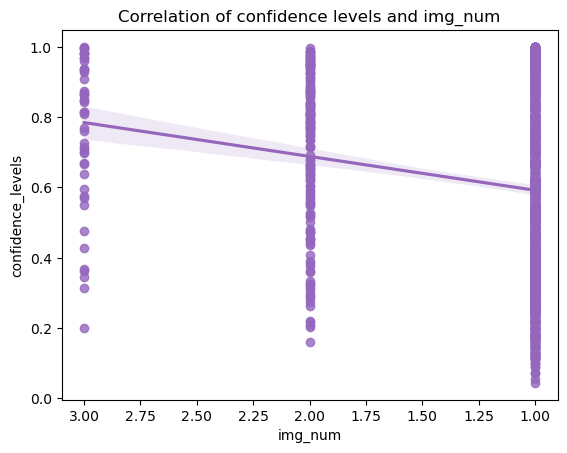

In [138]:
base_color = sn.color_palette()[4]
sn.regplot(data= df, x = 'img_num',y = 'confidence_levels', color = base_color).set(title = 'Correlation of confidence levels and img_num');
plt.gca().invert_xaxis()

### The scatterplot above shows the relationship between neural newtwork prediction and the confidence levels,it can be seen that there is an decrease in the confidence levels  as the img_num value  increases(1 is the most precise prediction and 3 the least precise) and this simply means that the accuracy of the neural network declines. Because a higher img_num means a less accurate prediction.

### INSIGHT 2:
### Most Popular Dog breeds

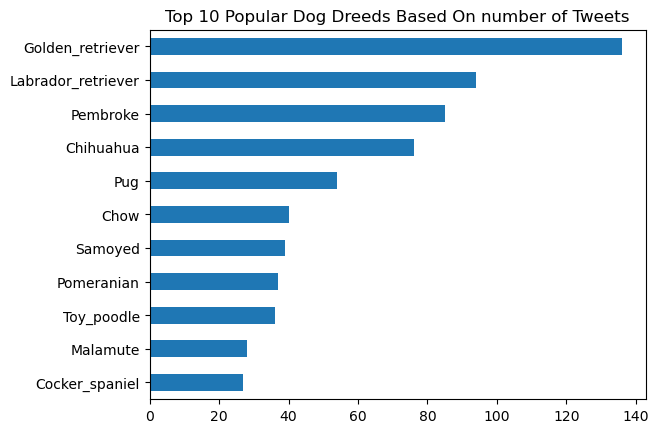

In [139]:
#most popular dog breeds based on number of tweets
df.dog_breed.value_counts()[10::-1].plot(kind = 'barh',x= 'count',y ='dog_breed', title = 'Top 10 Popular Dog Dreeds Based On number of Tweets');

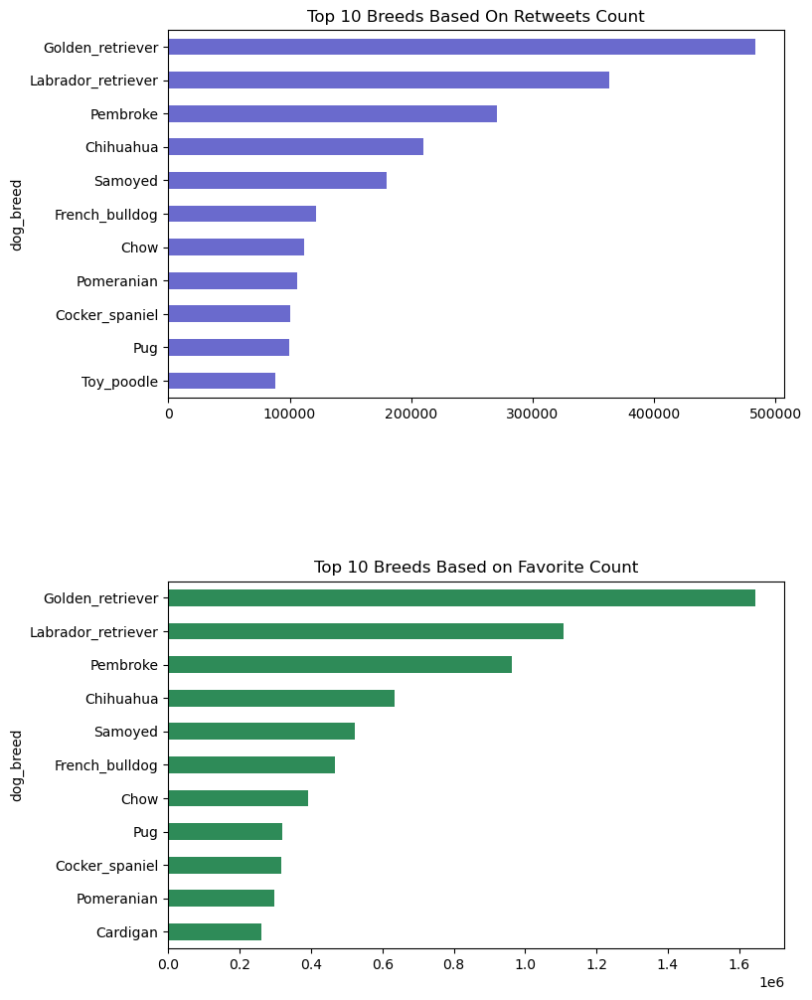

In [140]:
#Most popular dogs based on retweets and favourit counts
# creation of the dataframe that will be used,involving only certain columns
columns = ['dog_breed', 'retweet_count', 'favorite_count']
df_breed = df[columns]

breed_retweet = df_breed.groupby('dog_breed')['retweet_count'].agg('sum').sort_values(ascending=False)[10::-1]
breed_favorite = df_breed.groupby('dog_breed')['favorite_count'].agg('sum').sort_values(ascending=False)[10::-1]

# Plot horizontal bar chart
fig, (ax1, ax2) = plt.subplots(2, 1)

# Top 10 breeds based on number of retweets
breed_retweet.plot.barh(ax=ax1, figsize=(8,12), color='#6A6ACD')
ax1.set_title("Top 10 Breeds Based On Retweets Count")

# Top 10 breeds based on number of favorite
breed_favorite.plot.barh(ax=ax2, color='#2E8B58')
ax2.set_title("Top 10 Breeds Based on Favorite Count")

fig.subplots_adjust(hspace=0.5)

The five most popular dog breeds based on tweets,retweets and favorite counts are the golden_retriever(no 1),labrador_retriever(no2),pembroke(no3),chihuahua(no4) and samoyed(no 5).These breeds constantly topped the charts as can be seen from the plots above.Positions 1-4 was constantly dominated by the dog_breeds holding the positions across the 3 parameters used for the analysis.The samoyed breed was the 5th most popular dog based on the retweets and favorites counts , but not tweets.Although it came in at no 7 based on tweets.
These plots reveals that these dog breeds are highly popular and most talked/tweeted about amongst twitter users

#### 

## INSIGHT 3:
####  DOG BREED WITH HIGHESET RATINGS.
### This can be calculated by taking the numerator ratings for each of the dog breeds and grouped by the dog_breeds column.

In [141]:
# Make a list of top popular dog breeds based on number of tweets
top_tweet_count = df.dog_breed.value_counts().sort_values(ascending=False).nlargest(10).rename_axis('dog_breed').reset_index(name='tweet_counts')
breed_list = top_tweet_count.dog_breed.tolist()
# Average rating for top breeds based on number of tweets
avg_rating = df.groupby('dog_breed').rating_numerator.mean().sort_values(ascending=False).rename_axis('breed').reset_index(name='avg_rating')
breed_avg_rating = avg_rating[avg_rating['breed'].isin(breed_list)]
breed_avg_rating

,breed,avg_rating
12,Samoyed,11.666667
13,Chow,11.600000
14,Golden_retriever,11.544118
20,Pembroke,11.411765
31,Pomeranian,11.189189
37,Labrador_retriever,11.106383
40,Toy_poodle,11.055556
54,Malamute,10.821429
63,Chihuahua,10.657895
86,Pug,10.240741


Once again,for dogs with highest ratings amongst twitter users, we have a list similar to the popularity list earlier. The samoyed breed has the highest rating followed by the chow breed,golden retriever, pembroke,labrador retriever, toy_poodle , malamute, chihuahua and pug. The dog breeds with highest ratings all have at least appeared once in the most popular breeds contest using the retweets, tweets and favorite counts.
This arouses a new insight : is there any correlation between ratings and popularity?

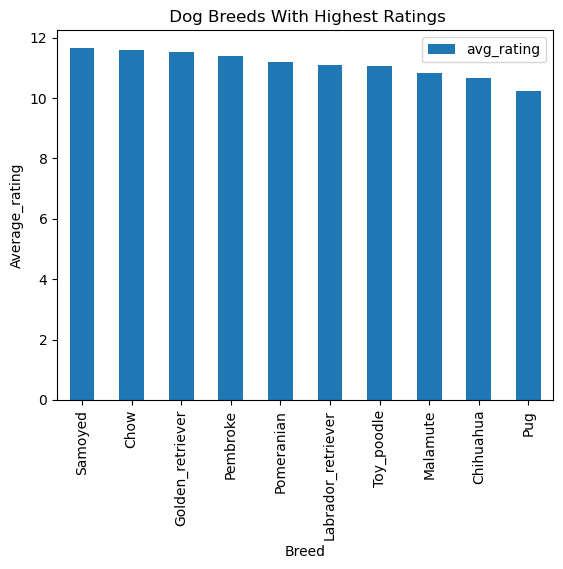

In [142]:
breed_avg_rating.plot(kind='bar', x='breed', y='avg_rating')  
plt.title(' Dog Breeds With Highest Ratings')
plt.ylabel("Average_rating")
plt.xlabel("Breed");

### INSIGHT 4 : 
DOG BREEDS WITH LEAST RATINGS

In [143]:
# Make a list of least popular dog breeds based on number of tweets
top_tweet_count = df.dog_breed.value_counts().sort_values(ascending=False).nsmallest(10).rename_axis('dog_breed').reset_index(name='tweet_counts')
breed_list = top_tweet_count.dog_breed.tolist()
# Average rating for top breeds based on number of tweets
avg_rating = df.groupby('dog_breed').rating_numerator.mean().sort_values(ascending=True).rename_axis('breed').reset_index(name='least_avg_rating')
breed_avg_rating = avg_rating[avg_rating['breed'].isin(breed_list)]

breed_avg_rating

,breed,least_avg_rating
0,Japanese_spaniel,5.0
4,African_hunting_dog,8.0
7,Scotch_terrier,9.0
8,Picket_fence,9.0
25,Groenendael,10.0
28,Ice_lolly,10.0
72,Entlebucher,11.0
109,Standard_schnauzer,12.0
110,Rotisserie,12.0
113,Silky_terrier,12.0


The dog breed with least rating is the japanese_spaniel followed by the african hunting dog and  scotch terrier with a tie in number 2. 

### LIMITATIONS:
#### The dataset used for the analysis does not have any control standards, and this greatly affects how null or abnormal values for the ratings will be treated. It makes it alot less accuarate and alot more difficult for manipulation.
#### The absence of a standard list of known dog breeds makes the cleaning process more tasking. I think a list of all known dog breeds should have been provided , in order to make the cleaning process for the dog breeds easy

# references
https://sparkbyexamples.com/pandas/pandas-convert-string-column-to-datetime/#:~:text=Use%20pandas%20to_datetime()%20function,string%20you%20wanted%20to%20convert.

https://www.geeksforgeeks.org/drop-rows-from-the-dataframe-based-on-certain-condition-applied-on-a-column/
https://sparkbyexamples.com/pandas/pandas-merge-multiple-dataframes-2/
https://stackoverflow.com/questions/16424493/pandas-setting-no-of-max-rowsk
https://www.geeksforgeeks.org/how-to-drop-rows-that-contain-a-specific-value-in-pandas/
https://stackoverflow.com/questions/18172851/deleting-dataframe-row-in-pandas-based-on-column-value
https://stackoverflow.com/questions/43269548/pandas-how-to-remove-rows-from-a-dataframe-based-on-a-list
https://github.com/Monicajhe/Wrangle-and-Analyze-Data/blob/master/wrangle_act.ipynb
https://seaborn.pydata.org/examples/part_whole_bars.html